# Model Deployment
```


In [ ]:
!pip install numpy librosa tensorflow scikit-learn


In [ ]:
# Load the models
def load_models():

    cnn_model = load_model('cnn_model.h5')
    bilstm_model = load_model('bi_lstm_model.h5')
    cnn_lstm_model = load_model('cnn_lstm_model.h5')
    gru_model = load_model('gru_model.h5')
    transformer_model = load_model('transformer_model.h5')
    svm_model = joblib.load('svm_model.pkl')
    return cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model

# Function to predict using each model
def predict_heartbeat(file_path, cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model):
    features = extract_pcg_features(file_path)
    features_cnn = np.expand_dims(features, axis=0)
    features_cnn_lstm = np.expand_dims(features, axis=0)

    cnn_prediction = cnn_model.predict(features_cnn)
    bilstm_prediction = bilstm_model.predict(features_cnn)
    cnn_lstm_prediction = cnn_lstm_model.predict(features_cnn_lstm)
    gru_prediction = gru_model.predict(features_cnn)
    transformer_prediction = transformer_model.predict(features_cnn)

    features_flatten = features.reshape(1, -1)
    svm_pred_class = svm_model.predict(features_flatten)[0]

    label_map = {0: "Healthy", 1: "Unhealthy"}

    return {
        'CNN': label_map[np.argmax(cnn_prediction, axis=1)[0]],
        'BiLSTM': label_map[np.argmax(bilstm_prediction, axis=1)[0]],
        'CNN-LSTM': label_map[np.argmax(cnn_lstm_prediction, axis=1)[0]],
        'GRU': label_map[np.argmax(gru_prediction, axis=1)[0]],
        'Transformer': label_map[np.argmax(transformer_prediction, axis=1)[0]],
        'SVM': label_map[svm_pred_class]
    }

# Function to predict for all files in the test directory
def predict_all_files(directory_path, cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model):
    predictions = {}
    for file_name in os.listdir(directory_path):
        if file_name.endswith('.wav'):
            file_path = os.path.join(directory_path, file_name)
            predictions[file_name] = predict_heartbeat(file_path, cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model)
    return predictions

if __name__ == '__main__':
    directory_path = '/content/test'

    # Loading models
    cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model = load_models()

    # Predictions for all files in the directory using different models
    all_predictions = predict_all_files(directory_path, cnn_model, bilstm_model, cnn_lstm_model, gru_model, transformer_model, svm_model)

    # Printing predictions
    for file_name, preds in all_predictions.items():
        print(f"File: {file_name}, Predictions: {preds}")


1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 0s 54ms/step
File: a0001.wav, Predictions: {'CNN': 'Unhealthy', 'BiLSTM': 'Unhealthy', 'CNN-LSTM': 'Unhealthy', 'GRU': 'Unhealthy', 'Transformer': 'Unhealthy', 'SVM': 'Unhealthy'}
File: a0005.wav, Predictions: {'CNN': 'Unhealthy', 'BiLSTM': 'Healthy', 'CNN-LSTM': 'Unhealthy', 'GRU': 'Healthy', 'Transformer': 'Unhealthy', 'SVM': 'Unhealthy'}
File: a0007.wav, Predictions: {'CNN': 'Healthy', 'BiLSTM': 'Healthy', 'CNN-LSTM': 'Healthy', 'GRU': 'Healthy', 'Transformer': 'Healthy', 'SVM': 'Healthy'}
File: a0012.wav, Predictions: {'CNN': 'Healthy', 'BiLSTM': 'Healthy', 'CNN-LSTM': 'Healthy', 'GRU': 'Healthy', 'Transformer': 'Healthy', 'SVM': 'Healthy'}
File: a0003.wav, Predictions: {'CNN': 'Unhealthy', 'BiLSTM': 'Unhealthy', 'CNN-LSTM': 'Healthy', 'GRU': 'Healthy', 'Transformer': 'Unhealthy', 'SVM': 'Healthy'}
File: a0002.wav, Predictions: {'CNN': 'Unhealthy', 'BiLSTM': 'Unhealthy', 'CNN-LSTM': 'Unhealthy', 'GRU': 'Healthy', 'Transformer': 'Healthy', 'SVM

# Problem Statement

In [ ]:
#1 Analyse and Understand the PCG Data using the dataset
# Developing and Evaluating Deep Learning Models to predict wheather the given sample is healthy or not

# Library Imports

In [ ]:
import os
import numpy as np
import pandas as pd
import librosa
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, LSTM, Bidirectional, GRU, TimeDistributed, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Input, LayerNormalization, MultiHeadAttention
from tensorflow.keras.models import Model
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Data Extraction and Loading

In [ ]:
drive.mount(r'/content/drive')

In [ ]:
folder_path = '/content/drive/My Drive/Cardiovascular Disease Detection/contents'
for filename in os.listdir(folder_path):
    print(filename)

labels.csv
.DS_Store
pcg
test


# EDA

In [ ]:

data = []
label = "healthy"
for filename in os.listdir("/content/drive/MyDrive/Cardiovascular Disease Detection/contents/pcg/healthy"):
   if filename.endswith('.wav'):
      data.append({'filename': filename, 'label': label})

healthy_audio_df = pd.DataFrame(data)
healthy_audio_df

,filename,label
0,a0049.wav,healthy
1,a0118.wav,healthy
2,a0094.wav,healthy
3,a0027.wav,healthy
4,a0029.wav,healthy
...,...,...
95,a0283.wav,healthy
96,a0212.wav,healthy
97,a0285.wav,healthy
98,a0139.wav,healthy


In [ ]:
data = []
label = "unhealthy"
for filename in os.listdir("/content/drive/MyDrive/Cardiovascular Disease Detection/contents/pcg/unhealthy"):
   if filename.endswith('.wav'):
      data.append({'filename': filename, 'label': label})

unhealthy_audio_df = pd.DataFrame(data)
unhealthy_audio_df

,filename,label
0,a0002.wav,unhealthy
1,a0024.wav,unhealthy
2,a0023.wav,unhealthy
3,a0005.wav,unhealthy
4,a0001.wav,unhealthy
...,...,...
95,a0135.wav,unhealthy
96,a0126.wav,unhealthy
97,a0100.wav,unhealthy
98,a0137.wav,unhealthy


In [ ]:
# Function to load and extract features from audio files
def extract_pcg_features(file_path, target_length=143):
    y, sr = librosa.load(file_path, sr=None)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
    mfccs = np.transpose(mfccs)
    if mfccs.shape[0] < target_length:
        pad_width = target_length - mfccs.shape[0]
        mfccs = np.pad(mfccs, pad_width=((0, pad_width), (0, 0)), mode='constant')
    elif mfccs.shape[0] > target_length:
        mfccs = mfccs[:target_length, :]
    mfccs = np.expand_dims(mfccs, axis=-1)
    return mfccs

# Function to load data
def load_data(healthy_dir, unhealthy_dir):
    pcg_data = []
    labels = []

    # Process healthy files
    for file_name in os.listdir(healthy_dir):
        if file_name.endswith('.wav'):
            file_path = os.path.join(healthy_dir, file_name)
            features = extract_pcg_features(file_path)
            pcg_data.append(features)
            labels.append('healthy')

    # Process unhealthy files
    for file_name in os.listdir(unhealthy_dir):
        if file_name.endswith('.wav'):
            file_path = os.path.join(unhealthy_dir, file_name)
            features = extract_pcg_features(file_path)
            pcg_data.append(features)
            labels.append('unhealthy')

    pcg_data = np.array(pcg_data)
    labels = np.array(labels)

    label_encoder = LabelEncoder()
    labels_encoded = label_encoder.fit_transform(labels)
    labels_categorical = to_categorical(labels_encoded)

    return train_test_split(pcg_data, labels_categorical, test_size=0.2, random_state=42)

In [ ]:
# Load and preprocess data
healthy_dir = '/content/drive/MyDrive/Cardiovascular Disease Detection/contents/pcg/healthy'
unhealthy_dir = '/content/drive/MyDrive/Cardiovascular Disease Detection/contents/pcg/unhealthy'
pcg_train, pcg_test, y_train, y_test = load_data(healthy_dir, unhealthy_dir)

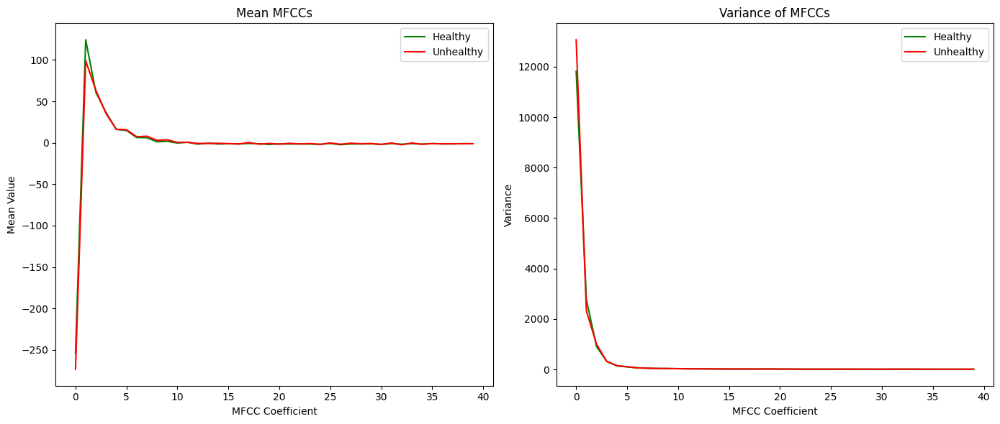

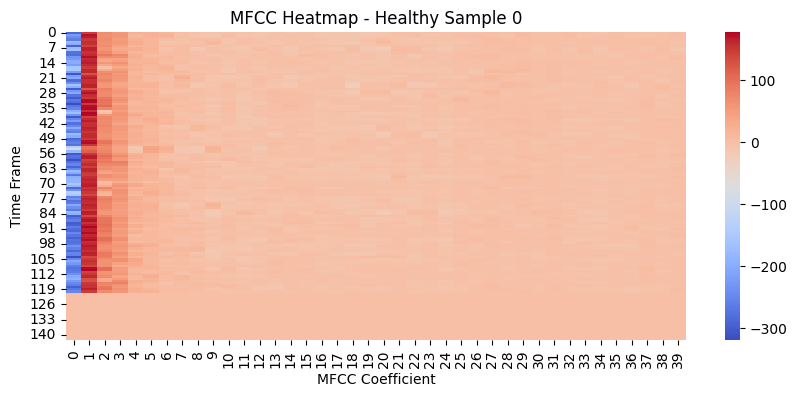

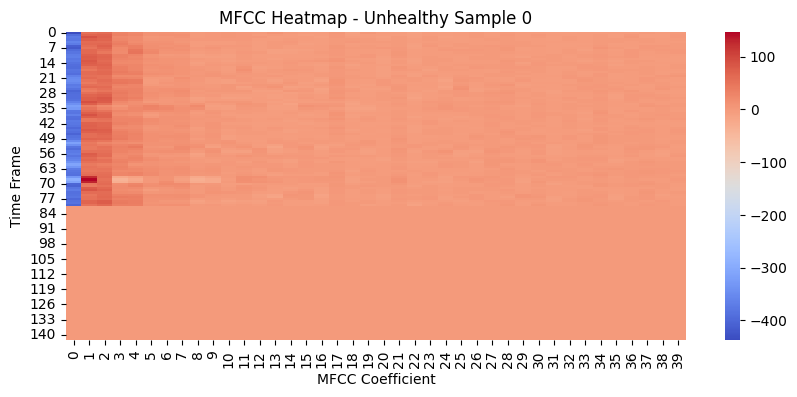

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split


# Load data
X_train, X_test, y_train, y_test = load_data(healthy_dir, unhealthy_dir)

# Calculate mean and variance of MFCCs for healthy and unhealthy samples
def calculate_mfcc_stats(data, label):
    mfcc_means = np.mean(data, axis=(0, 1))
    mfcc_vars = np.var(data, axis=(0, 1))
    return mfcc_means, mfcc_vars

# Filter healthy and unhealthy samples
healthy_data = X_train[np.argmax(y_train, axis=1) == 0]
unhealthy_data = X_train[np.argmax(y_train, axis=1) == 1]

# Calculate stats
healthy_means, healthy_vars = calculate_mfcc_stats(healthy_data, 'healthy')
unhealthy_means, unhealthy_vars = calculate_mfcc_stats(unhealthy_data, 'unhealthy')

# Plot the means and variances
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(healthy_means, label='Healthy', color='green')
plt.plot(unhealthy_means, label='Unhealthy', color='red')
plt.title('Mean MFCCs')
plt.xlabel('MFCC Coefficient')
plt.ylabel('Mean Value')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(healthy_vars, label='Healthy', color='green')
plt.plot(unhealthy_vars, label='Unhealthy', color='red')
plt.title('Variance of MFCCs')
plt.xlabel('MFCC Coefficient')
plt.ylabel('Variance')
plt.legend()

plt.tight_layout()
plt.show()

# Heatmap for a sample
def plot_mfcc_heatmap(data, label, index):
    plt.figure(figsize=(10, 4))
    sns.heatmap(data[index].squeeze(), cmap='coolwarm')
    plt.title(f'MFCC Heatmap - {label} Sample {index}')
    plt.xlabel('MFCC Coefficient')
    plt.ylabel('Time Frame')
    plt.show()

# Plot heatmaps for a sample from each class
plot_mfcc_heatmap(healthy_data, 'Healthy', 0)
plot_mfcc_heatmap(unhealthy_data, 'Unhealthy', 0)


# Model Development

Epoch 1/20
4/4 [==============================] - 3s 372ms/step - loss: 9.6682 - accuracy: 0.5703 - val_loss: 0.6425 - val_accuracy: 0.7500
Epoch 2/20
4/4 [==============================] - 1s 272ms/step - loss: 3.7858 - accuracy: 0.6250 - val_loss: 0.8108 - val_accuracy: 0.5625
Epoch 3/20
4/4 [==============================] - 1s 274ms/step - loss: 1.3501 - accuracy: 0.6719 - val_loss: 0.6172 - val_accuracy: 0.5938
Epoch 4/20
4/4 [==============================] - 1s 266ms/step - loss: 0.8056 - accuracy: 0.6641 - val_loss: 0.6301 - val_accuracy: 0.6562
Epoch 5/20
4/4 [==============================] - 1s 388ms/step - loss: 0.7198 - accuracy: 0.6016 - val_loss: 0.6481 - val_accuracy: 0.5625
Epoch 6/20
4/4 [==============================] - 2s 453ms/step - loss: 0.6555 - accuracy: 0.6562 - val_loss: 0.6480 - val_accuracy: 0.5938
Epoch 7/20
4/4 [==============================] - 2s 400ms/step - loss: 0.6262 - accuracy: 0.5938 - val_loss: 0.6412 - val_accuracy: 0.6562
Epoch 8/20
4/4 [====

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2/2 [==============================] - 0s 22ms/step - loss: 0.5341 - accuracy: 0.7000
CNN Test Accuracy: 0.699999988079071
2/2 [==============================] - 2s 40ms/step - loss: 1.5366 - accuracy: 0.6750
BiLSTM Test Accuracy: 0.675000011920929
2/2 [==============================] - 1s 26ms/step - loss: 0.7747 - accuracy: 0.7500
GRU Test Accuracy: 0.75


2/2 [==============================] - 1s 30ms/step - loss: 0.6357 - accuracy: 0.7000
CNN-LSTM Test Accuracy: 0.699999988079071


2/2 [==============================] - 1s 50ms/step - loss: 0.6223 - accuracy: 0.7750
Transformer Test Accuracy: 0.7749999761581421
SVM Test Accuracy: 0.675
2/2 [==============================] - 0s 20ms/step
Classification Report for CNN:
              precision    recall  f1-score   support

           0       0.70      0.76      0.73        21
           1       0.71      0.63      0.67        19

    accuracy                           0.70        40
   macro avg       0.70      0.70      0.70        40
weighted avg       0.70      0.70      0.70        40



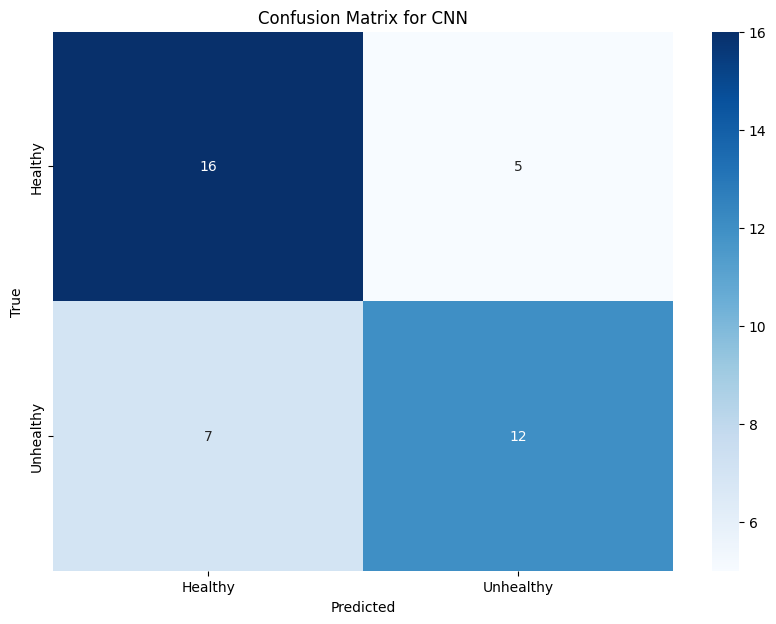

2/2 [==============================] - 2s 37ms/step
Classification Report for BiLSTM:
              precision    recall  f1-score   support

           0       0.72      0.62      0.67        21
           1       0.64      0.74      0.68        19

    accuracy                           0.68        40
   macro avg       0.68      0.68      0.67        40
weighted avg       0.68      0.68      0.67        40



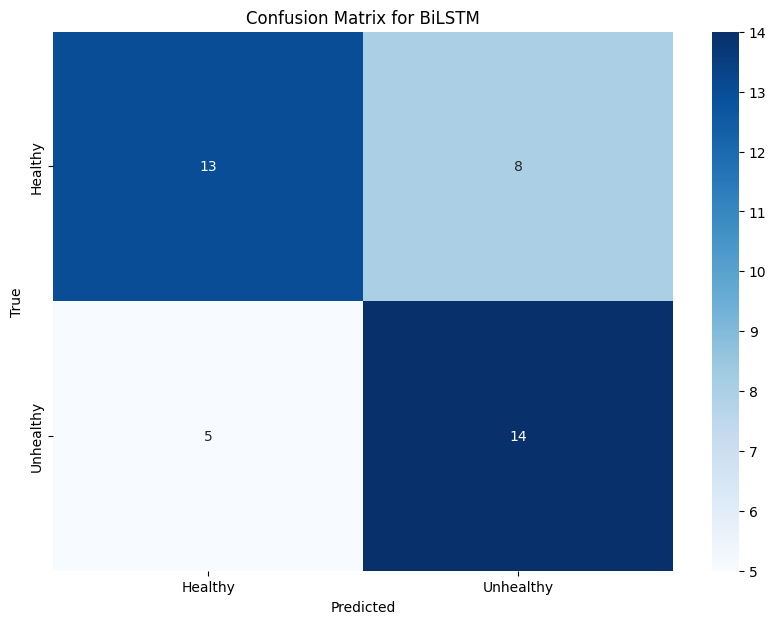

2/2 [==============================] - 1s 21ms/step
Classification Report for GRU:
              precision    recall  f1-score   support

           0       0.74      0.81      0.77        21
           1       0.76      0.68      0.72        19

    accuracy                           0.75        40
   macro avg       0.75      0.75      0.75        40
weighted avg       0.75      0.75      0.75        40



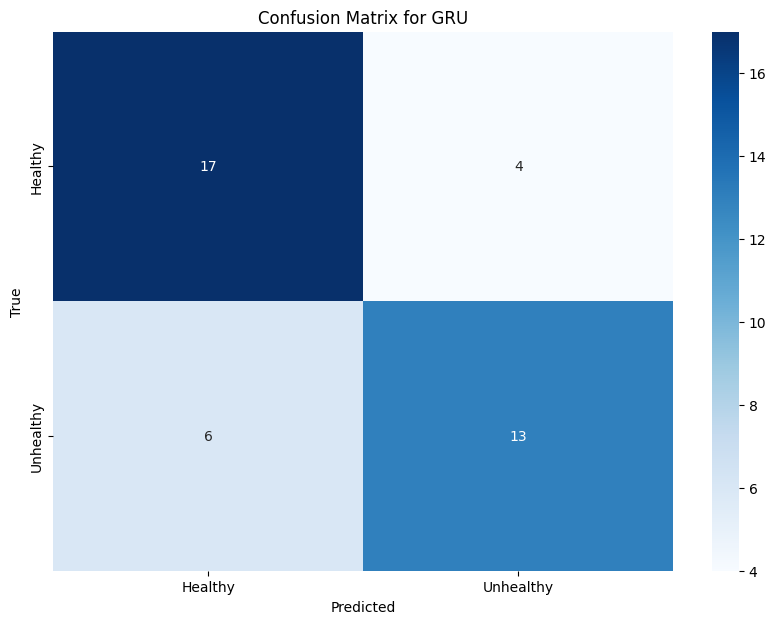

2/2 [==============================] - 1s 25ms/step
Classification Report for CNN-LSTM:
              precision    recall  f1-score   support

           0       0.76      0.62      0.68        21
           1       0.65      0.79      0.71        19

    accuracy                           0.70        40
   macro avg       0.71      0.70      0.70        40
weighted avg       0.71      0.70      0.70        40



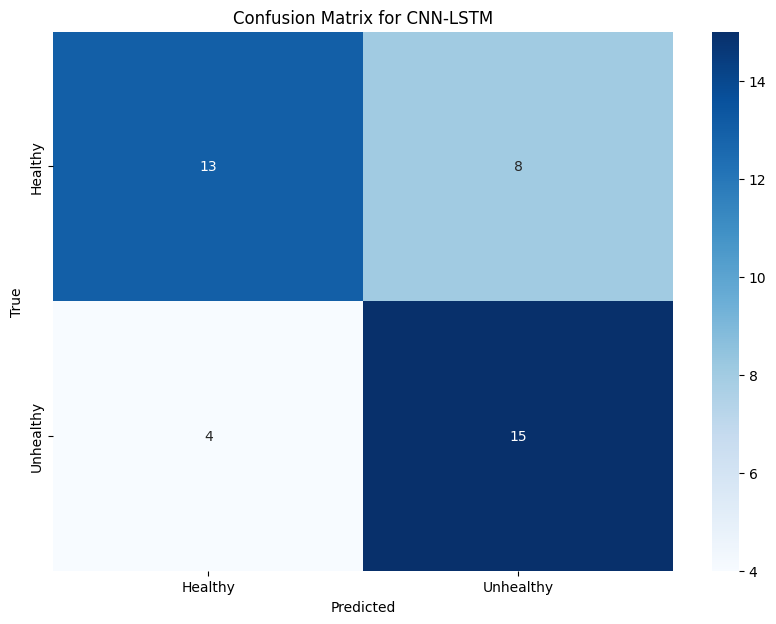

2/2 [==============================] - 1s 48ms/step
Classification Report for Transformer:
              precision    recall  f1-score   support

           0       0.83      0.71      0.77        21
           1       0.73      0.84      0.78        19

    accuracy                           0.78        40
   macro avg       0.78      0.78      0.77        40
weighted avg       0.78      0.78      0.77        40



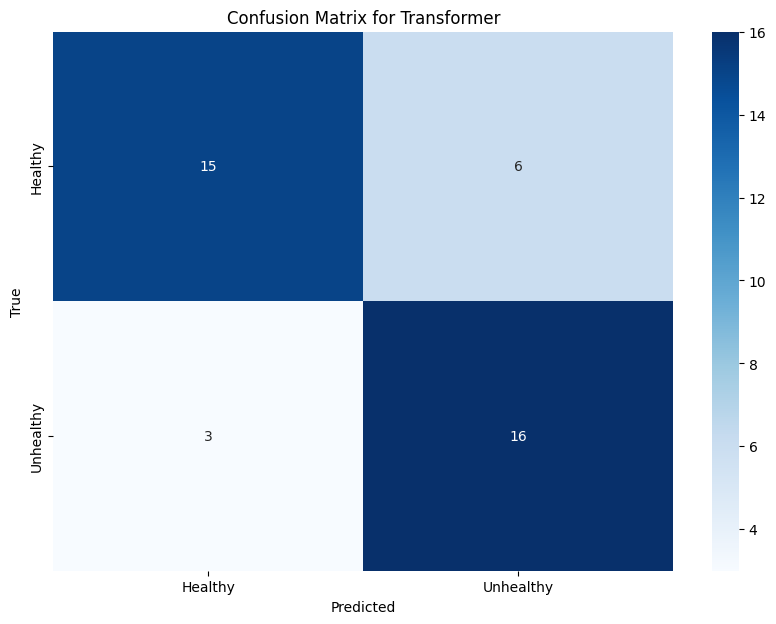

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.68      0.71      0.70        21
           1       0.67      0.63      0.65        19

    accuracy                           0.68        40
   macro avg       0.67      0.67      0.67        40
weighted avg       0.67      0.68      0.67        40



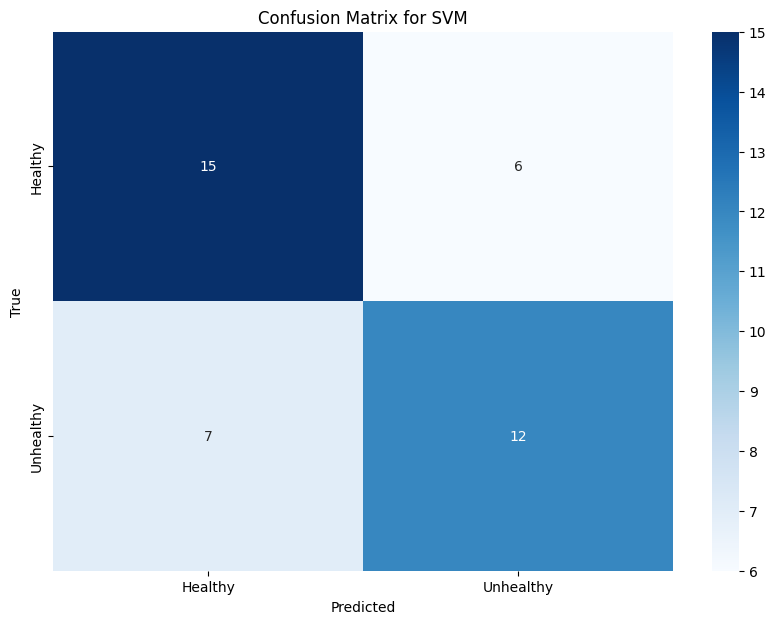

2/2 [==============================] - 0s 82ms/step


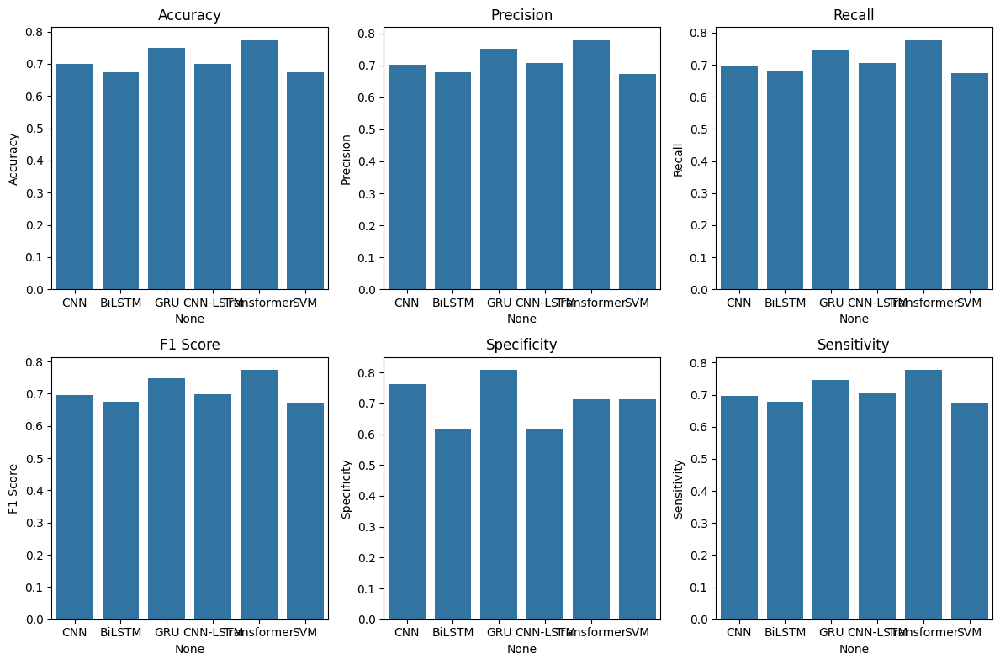

In [ ]:


# CNN Model definition
def build_cnn_model(input_shape, num_classes):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    return model

# BiLSTM Model definition
def build_bilstm_model(input_shape, num_classes):
    model = Sequential([
        Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape),
        Bidirectional(LSTM(64)),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    return model

# GRU Model definition
def build_gru_model(input_shape, num_classes):
    model = Sequential([
        GRU(64, return_sequences=True, input_shape=input_shape),
        GRU(64),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    return model

# CNN-LSTM model definition
def build_cnn_lstm_model(input_shape, num_classes):
    model = Sequential()
    model.add(TimeDistributed(Conv1D(32, 3, activation='relu'), input_shape=input_shape))
    model.add(TimeDistributed(MaxPooling1D(2)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(64))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    return model

# Transformer block definition
def transformer_block(inputs, num_heads, ff_dim, rate=0.1):
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=inputs.shape[-1])(inputs, inputs)
    attn_output = Dropout(rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)

    ffn_output = Dense(ff_dim, activation='relu')(out1)
    ffn_output = Dense(inputs.shape[-1])(ffn_output)
    ffn_output = Dropout(rate)(ffn_output)
    return LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

# Transformer model definition
def build_transformer_model(input_shape, num_heads, ff_dim, num_blocks, num_classes):
    inputs = Input(shape=input_shape)
    x = inputs
    for _ in range(num_blocks):
        x = transformer_block(x, num_heads, ff_dim)
    x = GlobalAveragePooling1D()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Load and preprocess data
healthy_dir = '/content/pcg/healthy'
unhealthy_dir = '/content/pcg/unhealthy'
pcg_train, pcg_test, y_train, y_test = load_data(healthy_dir, unhealthy_dir)

# Define input shape
input_shape = (143, 40, 1)
input_shape_lstm = (143, 40)

# Build and compile models
cnn_model = build_cnn_model(input_shape, num_classes=2)
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

bilstm_model = build_bilstm_model(input_shape_lstm, num_classes=2)
bilstm_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

gru_model = build_gru_model(input_shape_lstm, num_classes=2)
gru_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

cnn_lstm_model = build_cnn_lstm_model((143, 40, 1), num_classes=2)
cnn_lstm_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

transformer_model = build_transformer_model((143, 40), num_heads=4, ff_dim=128, num_blocks=4, num_classes=2)
transformer_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Flatten data for SVM
pcg_train_flatten = pcg_train.reshape(pcg_train.shape[0], -1)
pcg_test_flatten = pcg_test.reshape(pcg_test.shape[0], -1)

# Train SVM model
svm_model = SVC(kernel='linear', probability=True)
svm_model.fit(pcg_train_flatten, np.argmax(y_train, axis=1))

# Train models
cnn_model.fit(pcg_train, y_train, epochs=20, batch_size=32, validation_split=0.2)
bilstm_model.fit(pcg_train[:, :, :, 0], y_train, epochs=20, batch_size=32, validation_split=0.2)
gru_model.fit(pcg_train[:, :, :, 0], y_train, epochs=20, batch_size=32, validation_split=0.2)
cnn_lstm_model.fit(np.expand_dims(pcg_train, axis=-1), y_train, epochs=20, batch_size=32, validation_split=0.2)
transformer_model.fit(pcg_train[:, :, :, 0], y_train, epochs=20, batch_size=32, validation_split=0.2)

# Save models
cnn_model.save('cnn_model.h5')
bilstm_model.save('bi_lstm_model.h5')
gru_model.save('gru_model.h5')
cnn_lstm_model.save('cnn_lstm_model.h5')
transformer_model.save('transformer_model.h5')
joblib.dump(svm_model, 'svm_model.pkl')

# Load models
def load_models():
    cnn_model = load_model('cnn_model.h5')
    bilstm_model = load_model('bi_lstm_model.h5')
    gru_model = load_model('gru_model.h5')
    cnn_lstm_model = load_model('cnn_lstm_model.h5')
    transformer_model = load_model('transformer_model.h5')
    svm_model = joblib.load('svm_model.pkl')
    return cnn_model, bilstm_model, cnn_lstm_model, transformer_model, svm_model

cnn_model, bilstm_model, cnn_lstm_model, transformer_model, svm_model = load_models()

# Evaluate models
cnn_loss, cnn_acc = cnn_model.evaluate(pcg_test, y_test)
print(f'CNN Test Accuracy: {cnn_acc}')

bilstm_loss, bilstm_acc = bilstm_model.evaluate(pcg_test[:, :, :, 0], y_test)
print(f'BiLSTM Test Accuracy: {bilstm_acc}')
gru_loss, gru_acc = gru_model.evaluate(pcg_test[:, :, :, 0], y_test)
print(f'GRU Test Accuracy: {gru_acc}')
cnn_lstm_loss, cnn_lstm_acc = cnn_lstm_model.evaluate(np.expand_dims(pcg_test, axis=-1), y_test)
print(f'CNN-LSTM Test Accuracy: {cnn_lstm_acc}')
transformer_loss, transformer_acc = transformer_model.evaluate(pcg_test[:, :, :, 0], y_test)
print(f'Transformer Test Accuracy: {transformer_acc}')
svm_predictions = svm_model.predict(pcg_test_flatten)
svm_acc = np.mean(svm_predictions == np.argmax(y_test, axis=1))
print(f'SVM Test Accuracy: {svm_acc}')

# Generate classification report and confusion matrix
def plot_classification_report_and_confusion_matrix(model, X_test, y_test, model_type):
    y_pred = model.predict(X_test)
    y_true = np.argmax(y_test, axis=1)
    if model_type == 'SVM':
        y_pred = y_pred
    else:
        y_pred = np.argmax(y_pred, axis=1)

    print(f"Classification Report for {model_type}:")
    print(classification_report(y_true, y_pred))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Unhealthy'], yticklabels=['Healthy', 'Unhealthy'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {model_type}')
    plt.show()

plot_classification_report_and_confusion_matrix(cnn_model, pcg_test, y_test, "CNN")
plot_classification_report_and_confusion_matrix(bilstm_model, pcg_test[:, :, :, 0], y_test, "BiLSTM")
plot_classification_report_and_confusion_matrix(gru_model, pcg_test[:, :, :, 0], y_test, "GRU")
plot_classification_report_and_confusion_matrix(cnn_lstm_model, np.expand_dims(pcg_test, axis=-1), y_test, "CNN-LSTM")
plot_classification_report_and_confusion_matrix(transformer_model, pcg_test[:, :, :, 0], y_test, "Transformer")
plot_classification_report_and_confusion_matrix(svm_model, pcg_test_flatten, y_test, "SVM")

# Calculate metrics for each model
def calculate_metrics(model, X_test, y_test, model_type):
    y_pred = model.predict(X_test)
    y_true = np.argmax(y_test, axis=1)
    if model_type == 'SVM':
        y_pred = y_pred
    else:
        y_pred = np.argmax(y_pred, axis=1)

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    sensitivity = recall  # Same as recall for binary classification

    return accuracy, precision, recall, f1, specificity, sensitivity

models = ['CNN', 'BiLSTM', 'GRU', 'CNN-LSTM', 'Transformer', 'SVM']
metrics = []

metrics.append(calculate_metrics(cnn_model, pcg_test, y_test, 'CNN'))
metrics.append(calculate_metrics(bilstm_model, pcg_test[:, :, :, 0], y_test, 'BiLSTM'))
metrics.append(calculate_metrics(gru_model, pcg_test[:, :, :, 0], y_test, 'GRU'))
metrics.append(calculate_metrics(cnn_lstm_model, np.expand_dims(pcg_test, axis=-1), y_test, 'CNN-LSTM'))
metrics.append(calculate_metrics(transformer_model, pcg_test[:, :, :, 0], y_test, 'Transformer'))
metrics.append(calculate_metrics(svm_model, pcg_test_flatten, y_test, 'SVM'))

metrics_df = pd.DataFrame(metrics, columns=['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Specificity', 'Sensitivity'], index=models)

# Plot metrics
def plot_metrics(metrics_df):
    plt.figure(figsize=(12, 8))

    # Accuracy
    plt.subplot(2, 3, 1)
    sns.barplot(x=metrics_df.index, y=metrics_df['Accuracy'])
    plt.title('Accuracy')

    # Precision
    plt.subplot(2, 3, 2)
    sns.barplot(x=metrics_df.index, y=metrics_df['Precision'])
    plt.title('Precision')

    # Recall
    plt.subplot(2, 3, 3)
    sns.barplot(x=metrics_df.index, y=metrics_df['Recall'])
    plt.title('Recall')

    # F1 Score
    plt.subplot(2, 3, 4)
    sns.barplot(x=metrics_df.index, y=metrics_df['F1 Score'])
    plt.title('F1 Score')

    # Specificity
    plt.subplot(2, 3, 5)
    sns.barplot(x=metrics_df.index, y=metrics_df['Specificity'])
    plt.title('Specificity')

    # Sensitivity
    plt.subplot(2, 3, 6)
    sns.barplot(x=metrics_df.index, y=metrics_df['Sensitivity'])
    plt.title('Sensitivity')

    plt.tight_layout()
    plt.show()

plot_metrics(metrics_df)


In [ ]:
pip install shap


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 4.3 MB/s eta 0:00:00


In [ ]:
import shap

# Define the load_models function here
def load_models():
    cnn_model = load_model('cnn_model.h5')
    bilstm_model = load_model('bi_lstm_model.h5')
    gru_model = load_model('gru_model.h5')
    cnn_lstm_model = load_model('cnn_lstm_model.h5')
    transformer_model = load_model('transformer_model.h5')
    svm_model = joblib.load('svm_model.pkl')
    return cnn_model, bilstm_model,gru_model, cnn_lstm_model, transformer_model, svm_model

# Now load the models
cnn_model, bilstm_model, gru_model, cnn_lstm_model, transformer_model, svm_model = load_models()

# Select a subset of the test data for SHAP
X_sample = pcg_test[:40]  # Using first 100 samples for SHAP

# Reshape for models that require different input shapes
X_sample_lstm = X_sample[:, :, :, 0]
X_sample_flatten = X_sample.reshape(X_sample.shape[0], -1)

In [ ]:
pip install lime


In [ ]:
import numpy as np
from lime import lime_tabular
from tensorflow.keras.models import load_model
import joblib
import pickle

# Define the models and their file paths
model_paths = {
    'cnn_model': 'cnn_model.h5',
    'transformer_model': 'transformer_model.h5',
    'cnn_lstm_model': 'cnn_lstm_model.h5',
    'bi_lstm_model': 'bi_lstm_model.h5',
    'svm_model': 'svm_model.pkl'
}

# Define the input data for each model
# Replace X_sample and X_sample_lstm with your actual input data
input_data = {
    'cnn_model': X_sample,
    'transformer_model': X_sample,
    'cnn_lstm_model': X_sample,
    'bi_lstm_model': X_sample,
    'svm_model': X_sample
}

# Define the summary of explanations
explanations_summary = {}

# Iterate through each model
for model_name, model_path in model_paths.items():
    print(f"Processing model: {model_name}")

    # Load the model
    if model_name == 'svm_model':
        with open(model_path, 'rb') as file:
            model = joblib.load(file)
    else:
        model = load_model(model_path)

    # Flatten the input data for LIME
    X_sample = input_data[model_name]
    X_sample_flatten = X_sample.reshape(X_sample.shape[0], -1)

    # Initialize LIME explainer
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=X_sample_flatten,
        feature_names=[f'Feature_{i}' for i in range(X_sample_flatten.shape[1])],
        class_names=['Class 0', 'Class 1'],
        mode='classification'
    )

    # Generate explanations for the first instance
    instance = X_sample_flatten[0]

    if model_name == 'svm_model':
        explanation = explainer.explain_instance(
            data_row=instance,
            predict_fn=model.predict_proba
        )
    else:
        explanation = explainer.explain_instance(
            data_row=instance,
            predict_fn=lambda x: model.predict(x.reshape(-1, *X_sample.shape[1:])).reshape(-1, 2)
        )

    # Visualize the explanation
    explanation.show_in_notebook(show_table=True, show_all=False)

    # Collect the explanation summary
    explanations_summary[model_name] = explanation.as_list()

# Print the summary of explanations for each model
for model_name, summary in explanations_summary.items():
    print(f"Explanation summary for {model_name}:")
    for feature, importance in summary:
        print(f"{feature}: {importance}")
    print("\n")


Processing model: cnn_model
157/157 [==============================] - 12s 75ms/step


Processing model: transformer_model
157/157 [==============================] - 34s 213ms/step


Processing model: cnn_lstm_model
157/157 [==============================] - 18s 112ms/step


Processing model: bi_lstm_model
157/157 [==============================] - 21s 120ms/step


Processing model: svm_model


Explanation summary for cnn_model:
Feature_5653 <= 0.00: 0.005628334557818748
Feature_5619 <= 0.00: -0.004392865273486403
Feature_4181 <= -3.26: -0.003753470422196341
Feature_5673 <= 0.00: 0.0025643201257907282
-1.57 < Feature_1711 <= 0.59: -0.0019036343263429802
Feature_5633 <= 0.00: 0.0018626312378572296
Feature_5613 <= 0.00: 0.001795658270334705
16.13 < Feature_3045 <= 22.67: -0.0016483887075883778
Feature_1812 > 3.26: 0.001220787538470671
-314.16 < Feature_1920 <= -258.08: 0.0008185263971669652


Explanation summary for transformer_model:
Feature_1227 > 0.30: 0.013394324874306406
-0.41 < Feature_5431 <= 0.00: -0.011608792291241777
-273.91 < Feature_5280 <= 0.00: -0.010438973700186935
Feature_1959 > 0.21: -0.010223929190342892
Feature_5651 <= 0.00: 0.008701197976461206
Feature_2482 > 80.77: 0.005638860481740936
Feature_5617 <= 0.00: -0.0047148229279449765
Feature_5636 <= 0.00: -0.0042783507194040045
Feature_1430 > 0.09: -0.0034697184807079666
-3.20 < Feature_1979 <= -1.15: -0.002995